In [ ]:
!pip install geopandas folium

import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt


In [ ]:
df = pd.read_csv('https://github.com/tylerheadley/denver-crime-statistics/raw/main/crime.csv', encoding='latin-1')

offense_codes = pd.read_csv('https://github.com/tylerheadley/denver-crime-statistics/raw/main/offense_codes.csv', encoding='latin-1')

# Print the first five rows of the dataframe
df.head()

,incident_id,offense_id,offense_code,offense_code_extension,offense_type_id,offense_category_id,first_occurrence_date,last_occurrence_date,reported_date,incident_address,geo_x,geo_y,geo_lon,geo_lat,district_id,precinct_id,neighborhood_id,is_crime,is_traffic,victim_count
0,202268791,202268791299900,2999,0,criminal-mischief-other,public-disorder,2/10/2022 2:50:00 AM,NaN,2/10/2022 3:16:00 AM,1107 N SANTA FE DR,3140929.0,1692612.0,-104.998910,39.733957,1,123,lincoln-park,1,0,1
1,2021387586,2021387586299900,2999,0,criminal-mischief-other,public-disorder,7/7/2021 9:02:00 PM,NaN,7/8/2021 12:55:00 AM,815 16TH ST,3142470.0,1697098.0,-104.993342,39.746248,6,611,cbd,1,0,1
2,2020641486,2020641486299900,2999,0,criminal-mischief-other,public-disorder,10/29/2020 1:30:00 AM,NaN,10/29/2020 4:31:00 AM,4745 N FEDERAL BLVD,3133352.0,1710396.0,-105.025520,39.782888,1,111,berkeley,1,0,1
3,2020293614,2020293614299900,2999,0,criminal-mischief-other,public-disorder,5/8/2020 5:00:00 AM,5/8/2020 6:30:00 PM,5/13/2020 10:00:00 AM,12295 E ALBROOK DR,3184065.0,1710782.0,-104.845074,39.783082,5,521,montbello,1,0,1
4,2020600882,2020600882299900,2999,0,criminal-mischief-other,public-disorder,10/8/2020 2:26:00 AM,NaN,10/8/2020 3:43:00 AM,2100 W 30TH AVE,3137149.0,1701888.0,-105.012173,39.759477,1,113,highland,1,0,1


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374495 entries, 0 to 374494
Data columns (total 20 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   incident_id             374495 non-null  int64  
 1   offense_id              374495 non-null  int64  
 2   offense_code            374495 non-null  int64  
 3   offense_code_extension  374495 non-null  int64  
 4   offense_type_id         374495 non-null  object 
 5   offense_category_id     374495 non-null  object 
 6   first_occurrence_date   374495 non-null  object 
 7   last_occurrence_date    205970 non-null  object 
 8   reported_date           374495 non-null  object 
 9   incident_address        360080 non-null  object 
 10  geo_x                   360080 non-null  float64
 11  geo_y                   360080 non-null  float64
 12  geo_lon                 358731 non-null  float64
 13  geo_lat                 358731 non-null  float64
 14  district_id         

In [ ]:
# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(df['geo_lon'], df['geo_lat'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

In [ ]:
# Create a base map
m = folium.Map(location=[df['geo_lat'].mean(), df['geo_lon'].mean()], zoom_start=5)

# Extract coordinates for heatmap, dropping rows with NaN values
# The .dropna() method removes rows with missing values in either 'geo_lat' or 'geo_lon' columns
heat_data = [[row['geo_lat'], row['geo_lon']] for index, row in df.dropna(subset=['geo_lat', 'geo_lon']).iterrows()]

# Add the heatmap layer
HeatMap(heat_data,
        radius=15,      # Adjust radius for point spread
        blur=10,        # Adjust blur for smoother appearance
        min_opacity=0.2 # Adjust minimum opacity for visibility
       ).add_to(m)

# add a legend


# Save map to an HTML file
m
# m.save('heatmap.html')

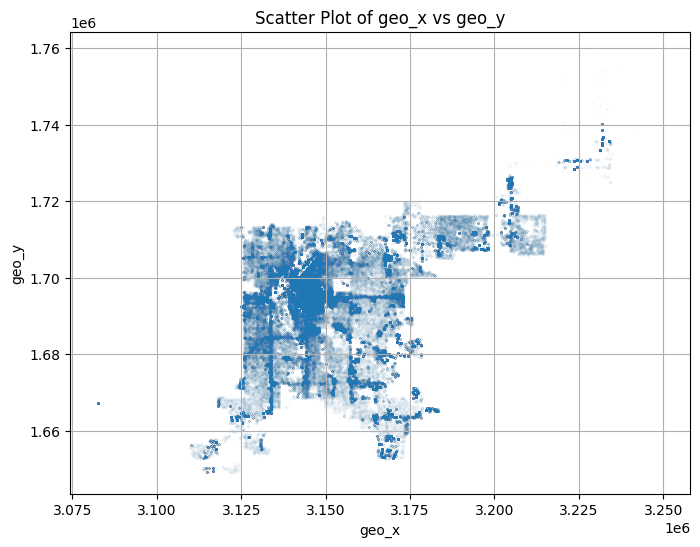

In [ ]:
plt.figure(figsize=(8, 6))  # Optional: Adjust the figure size
filtered_df = df[(df['geo_x'] >= 2500000) & (df['geo_x'] <= 5000000) & (df['geo_y'] >= 1000000) & (df['geo_y'] <= 2000000)]
plt.scatter(filtered_df['geo_x'], filtered_df['geo_y'], s=.001, alpha=0.5)
plt.title('Scatter Plot of geo_x vs geo_y')
plt.xlabel('geo_x')
plt.ylabel('geo_y')
plt.grid(True)
plt.show()

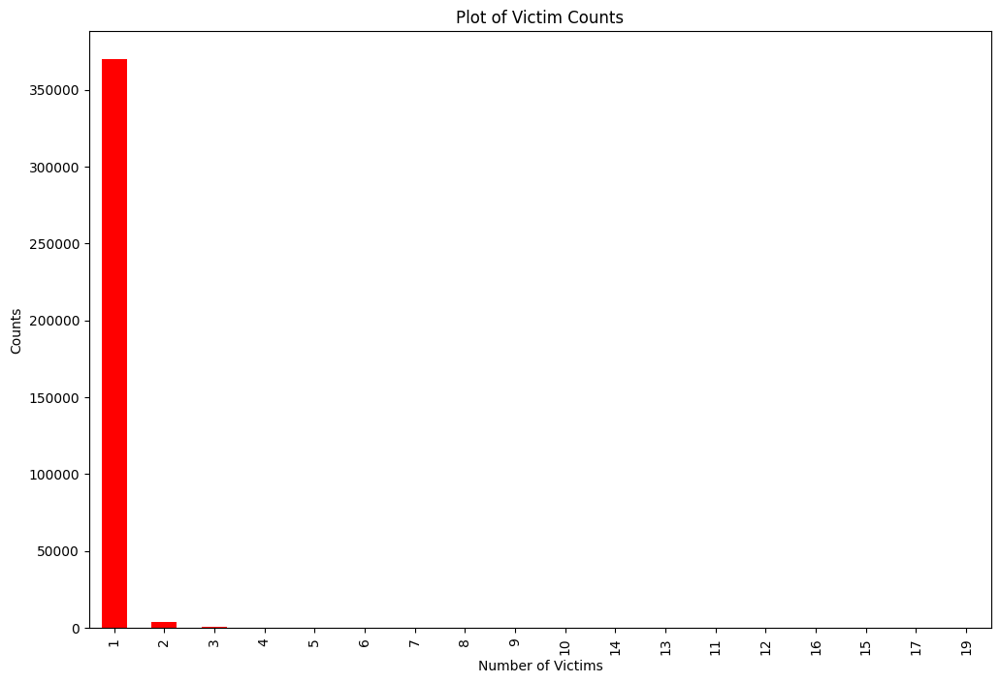

victim_count
1     369690
2       3452
3        720
4        278
5        159
6         79
7         49
8         28
9         14
10         6
14         5
13         4
11         3
12         3
16         2
15         1
17         1
19         1
Name: count, dtype: int64

In [ ]:
# Create the bar plot
plt.figure(figsize=(12, 8))
df['victim_count'].value_counts().plot(kind='bar', color='red')
plt.title('Plot of Victim Counts')
plt.xlabel('Number of Victims')
plt.ylabel('Counts')
plt.xticks(rotation=90)
plt.show()

df['victim_count'].value_counts()

In [ ]:
offense_codes.head()

,OBJECTID,OFFENSE_CODE,OFFENSE_CODE_EXTENSION,OFFENSE_TYPE_ID,OFFENSE_TYPE_NAME,OFFENSE_CATEGORY_ID,OFFENSE_CATEGORY_NAME,IS_CRIME,IS_TRAFFIC
0,1,2804,1,stolen-property-possession,Possession of stolen property,all-other-crimes,All Other Crimes,1,0
1,2,2804,2,fraud-possess-financial-device,Possession of a financial device,all-other-crimes,All Other Crimes,1,0
2,3,2901,0,damaged-prop-bus,Damaged business property,public-disorder,Public Disorder,1,0
3,4,2902,0,criminal-mischief-private,Criminal mischief to private property,public-disorder,Public Disorder,1,0
4,5,2903,0,criminal-mischief-public,Criminal mischief to public property,public-disorder,Public Disorder,1,0


In [ ]:
print(offense_codes.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   OBJECTID                300 non-null    int64 
 1   offense_code            300 non-null    int64 
 2   offense_code_extension  300 non-null    int64 
 3   OFFENSE_TYPE_ID         300 non-null    object
 4   OFFENSE_TYPE_NAME       300 non-null    object
 5   OFFENSE_CATEGORY_ID     300 non-null    object
 6   OFFENSE_CATEGORY_NAME   300 non-null    object
 7   IS_CRIME                300 non-null    int64 
 8   IS_TRAFFIC              300 non-null    int64 
dtypes: int64(5), object(4)
memory usage: 21.2+ KB


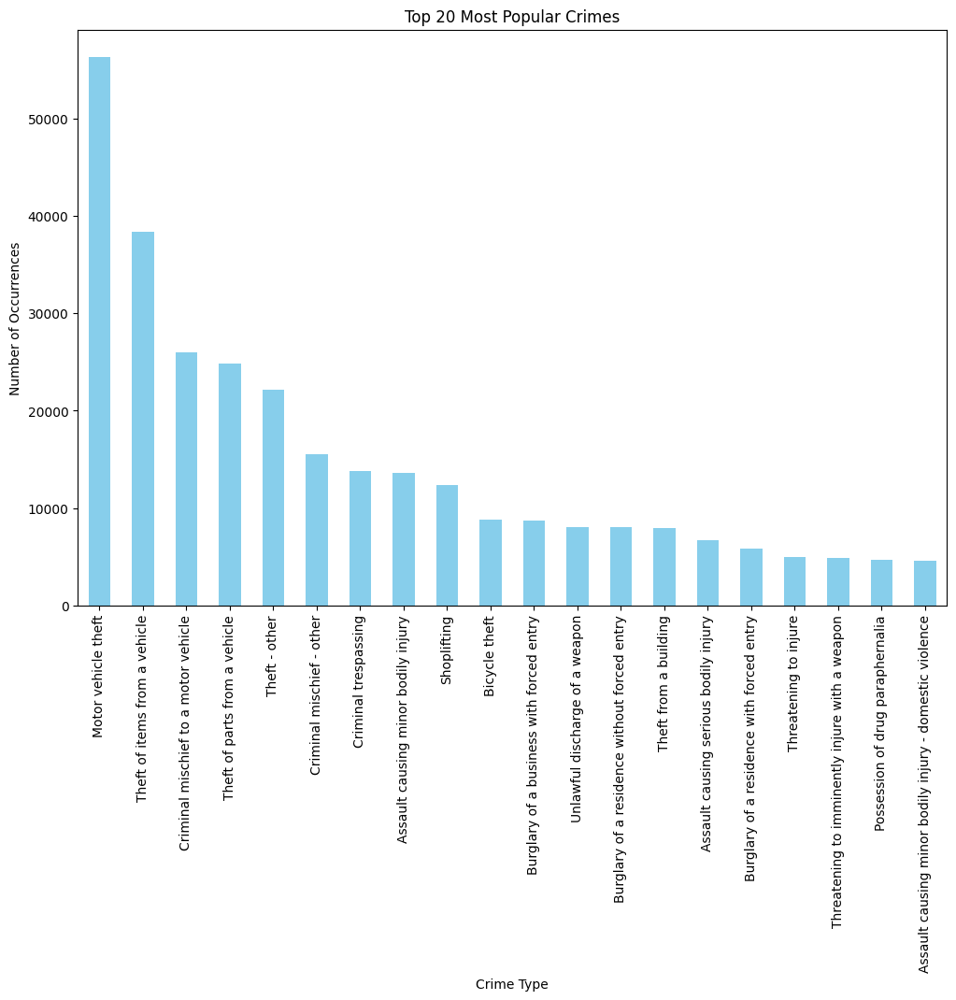

In [ ]:
# Merge df with offense_codes on offense_code
offense_codes.rename(columns={'OFFENSE_CODE': 'offense_code', 'OFFENSE_CODE_EXTENSION': 'offense_code_extension'}, inplace=True)

merged_df = pd.merge(df, offense_codes, on=['offense_code', "offense_code_extension"])

# Count the occurrences of each offense_type_name
crime_counts = merged_df['OFFENSE_TYPE_NAME'].value_counts().nlargest(20)

# Create the bar plot
plt.figure(figsize=(12, 8))
crime_counts.plot(kind='bar', color='skyblue')
plt.title('Top 20 Most Popular Crimes')
plt.xlabel('Crime Type')
plt.ylabel('Number of Occurrences')
plt.xticks(rotation=90)
plt.show()

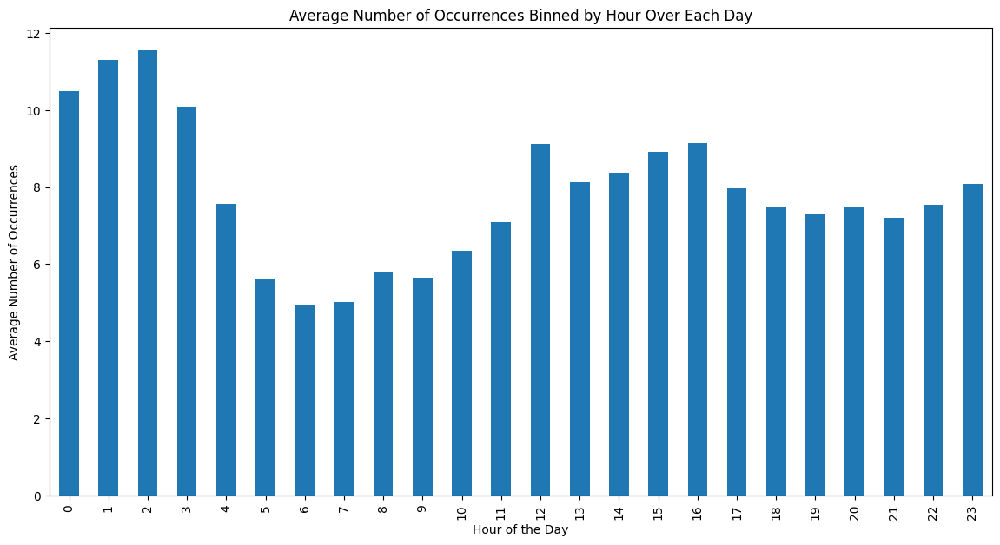

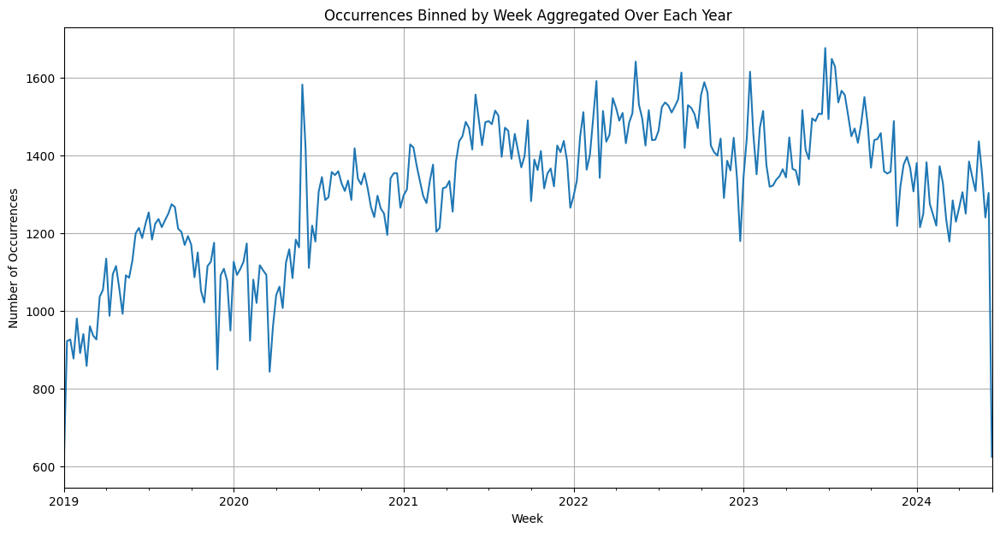

In [ ]:
df['first_occurrence_date'] = pd.to_datetime(df['first_occurrence_date'], errors='coerce')
df['last_occurrence_date'] = pd.to_datetime(df['last_occurrence_date'], errors='coerce')

# Calculate the mean datetime for each row
df['mean_occurrence_date'] = df[['first_occurrence_date', 'last_occurrence_date']].mean(axis=1)

# Plot 1: Binned by hour, aggregated over the course of each day
df['hour'] = df['mean_occurrence_date'].dt.hour
hourly_counts = df.groupby('hour').size()
hourly_avg = hourly_counts / df['mean_occurrence_date'].dt.date.nunique()

plt.figure(figsize=(14, 7))
hourly_avg.plot(kind='bar')
plt.title('Average Number of Occurrences Binned by Hour Over Each Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Number of Occurrences')
plt.show()

# Plot 2: Binned by week, aggregated over the course of each year
df_weekly = df.set_index('mean_occurrence_date').resample('W').size()
plt.figure(figsize=(14, 7))
df_weekly.plot()
plt.title('Occurrences Binned by Week Aggregated Over Each Year')
plt.xlabel('Week')
plt.ylabel('Number of Occurrences')
plt.grid(True)
plt.show()

<ipython-input-10-fa121bb2ce31>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['hour'] = filtered_df['mean_occurrence_date'].dt.hour


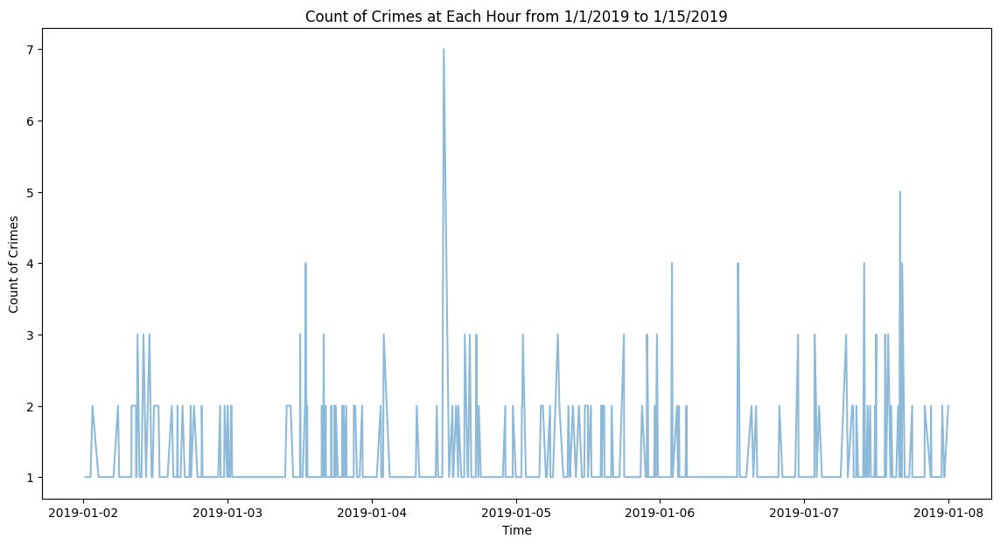

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame and 'mean_occurrence_date' is the column with datetime values
# Example DataFrame creation for demonstration purposes
# df = pd.DataFrame({
#     'mean_occurrence_date': pd.date_range(start='1/1/2019', periods=500, freq='H')
# })

# Filter the DataFrame for the specified date range
start_date = '2019-01-01'
end_date = '2019-01-8'
mask = (df['mean_occurrence_date'] >= start_date) & (df['mean_occurrence_date'] <= end_date)
filtered_df = df[mask]

# Extract hour from the datetime column
filtered_df['hour'] = filtered_df['mean_occurrence_date'].dt.hour

# Count occurrences for each hour
hourly_counts = filtered_df.groupby(filtered_df['mean_occurrence_date']).size().reset_index(name='count')

# Extract hour for plotting
hourly_counts['hour'] = hourly_counts['mean_occurrence_date'].dt.hour

# Plot scatter plot of the count of crimes at each hour
plt.figure(figsize=(14, 7))
plt.plot(hourly_counts['mean_occurrence_date'], hourly_counts['count'], alpha=0.5)
plt.title('Count of Crimes at Each Hour from 1/1/2019 to 1/15/2019')
plt.xlabel('Time')
plt.ylabel('Count of Crimes')
plt.show()



<ipython-input-12-ce8a49b15c16>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['date'] = filtered_df['mean_occurrence_date'].dt.date


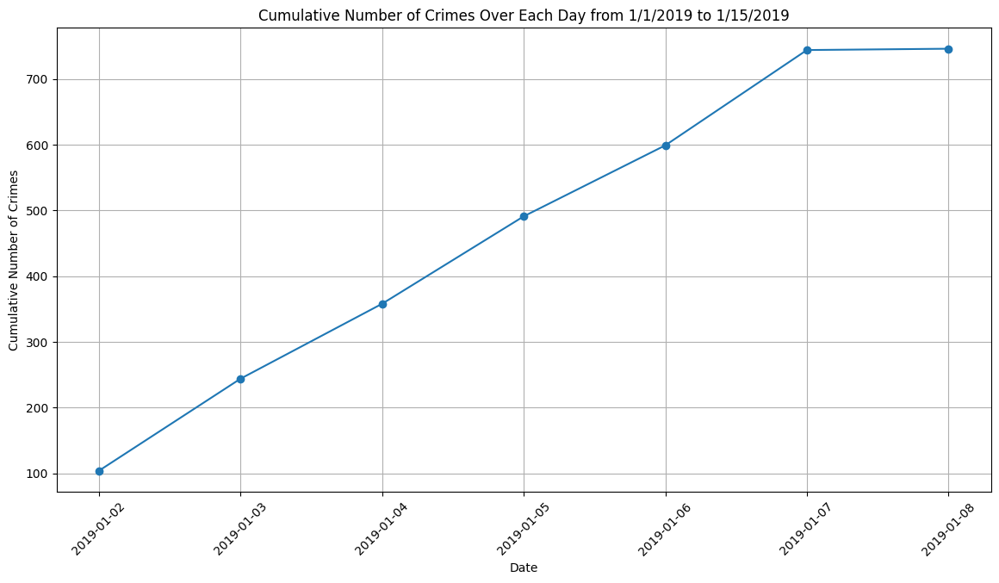

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame and 'mean_occurrence_date' is the column with datetime values
# Example DataFrame creation for demonstration purposes
# df = pd.DataFrame({
#     'mean_occurrence_date': pd.date_range(start='1/1/2019', periods=500, freq='H')
# })

# Filter the DataFrame for the specified date range
start_date = '2019-01-01'
end_date = '2019-01-8'
mask = (df['mean_occurrence_date'] >= start_date) & (df['mean_occurrence_date'] <= end_date)
filtered_df = df[mask]

# Extract date from the datetime column
filtered_df['date'] = filtered_df['mean_occurrence_date'].dt.date

# Count occurrences for each date
daily_counts = filtered_df.groupby('date').size().reset_index(name='count')

# Calculate the cumulative sum of crimes over each day
daily_counts['cumulative_count'] = daily_counts['count'].cumsum()

# Plot the cumulative sum of crimes over each day
plt.figure(figsize=(14, 7))
plt.plot(daily_counts['date'], daily_counts['cumulative_count'], marker='o')
plt.title('Cumulative Number of Crimes Over Each Day from 1/1/2019 to 1/15/2019')
plt.xlabel('Date')
plt.ylabel('Cumulative Number of Crimes')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

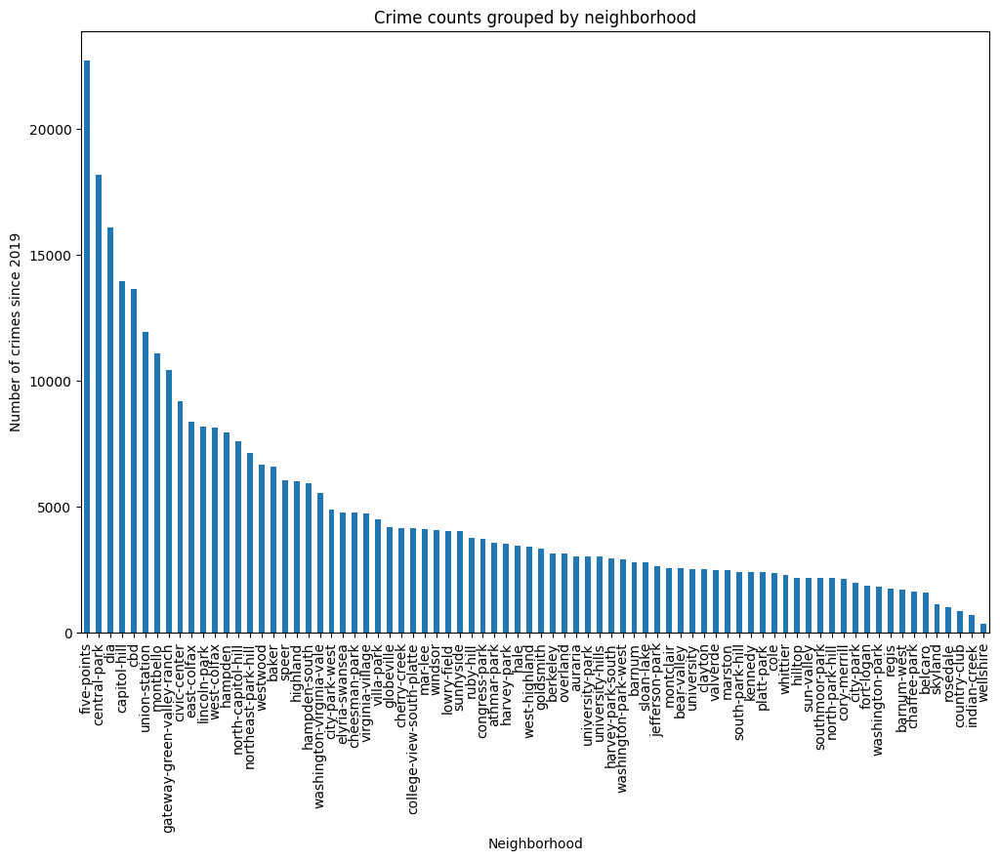

In [ ]:
import matplotlib.pyplot as plt

# Group by 'neighborhood_id' and count the number of rows for each neighborhood
neighborhood_counts = df['neighborhood_id'].value_counts()

# Create a bar plot
plt.figure(figsize=(12, 8))
neighborhood_counts.plot(kind='bar')
plt.title('Crime counts grouped by neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Number of crimes since 2019')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df['precinct_id']